In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import jax
jax.config.update('jax_platform_name', 'cpu')

In [3]:
from entot.data.data import create_gaussians, create_gaussian_split
from entot.plotting.plots import plot_1D
from entot.models.models import NoiseOutsourcingModel
from entot.models.utils import MixtureNormalSampler
import matplotlib.pyplot as plt
import numpy as np
import jax
import jax.numpy as jnp

In [4]:
sampler_source = MixtureNormalSampler([0], 1, 100, 0.5)
sampler_target = MixtureNormalSampler([-1.0,1.0], 1, 100, 0.1)

In [5]:
sm = NoiseOutsourcingModel(0.1, 512, 512, iterations=500, inner_iterations=20, input_dim=1, noise_dim=4, std=0.1, callback=plot_1D, callback_iters=5)

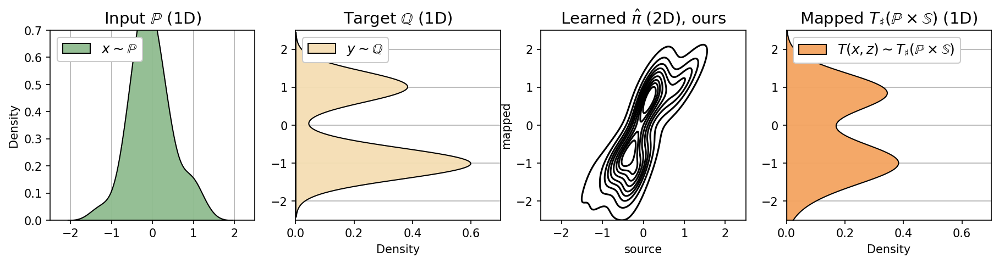

 99%|█████████▉| 496/500 [27:27<00:14,  3.59s/it]

(512, 2)


 99%|█████████▉| 497/500 [27:30<00:10,  3.42s/it]

(512, 2)


100%|█████████▉| 498/500 [27:33<00:06,  3.31s/it]

(512, 2)


100%|█████████▉| 499/500 [27:36<00:03,  3.22s/it]

(512, 2)


100%|██████████| 500/500 [27:39<00:00,  3.32s/it]


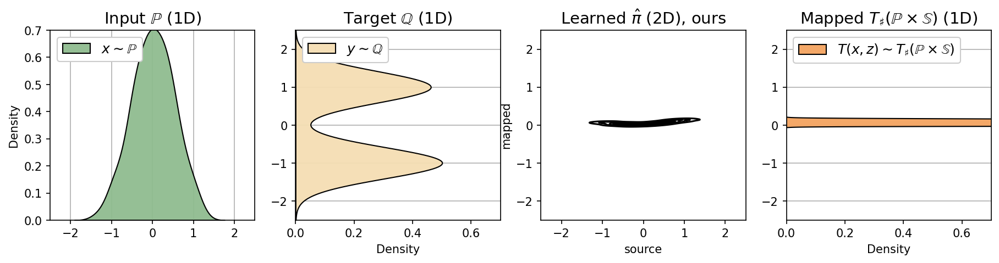

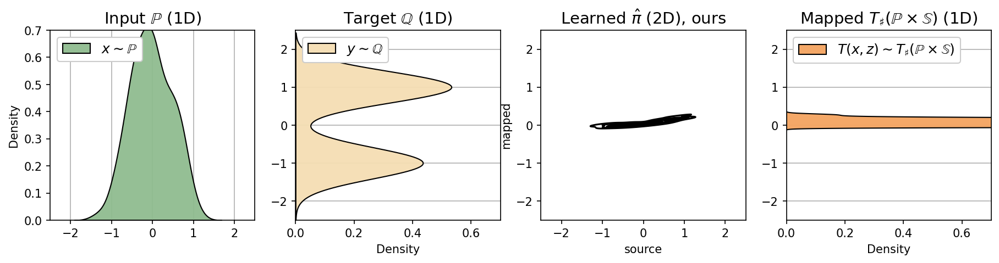

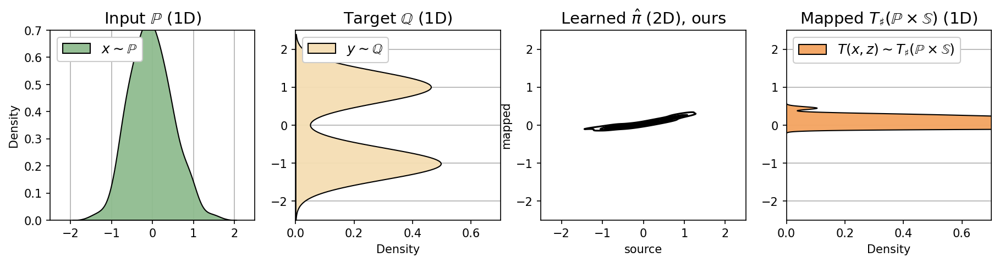

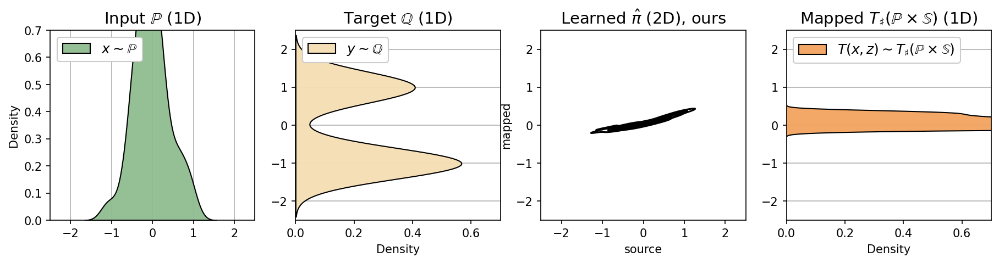

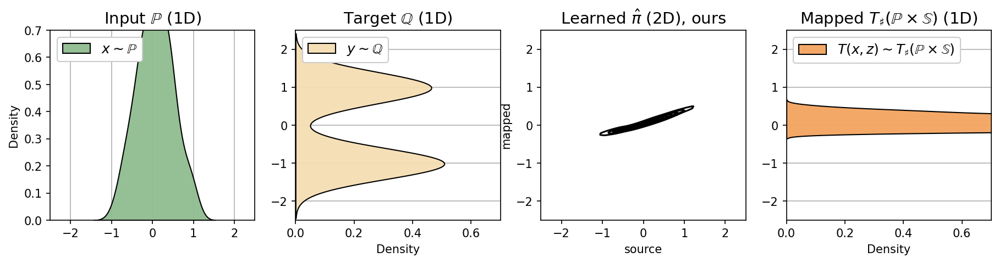

...

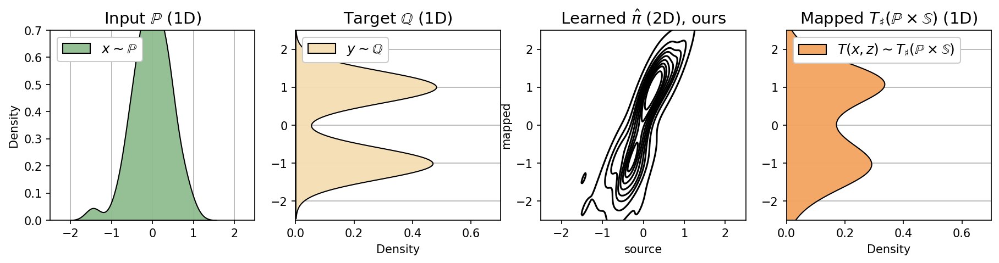

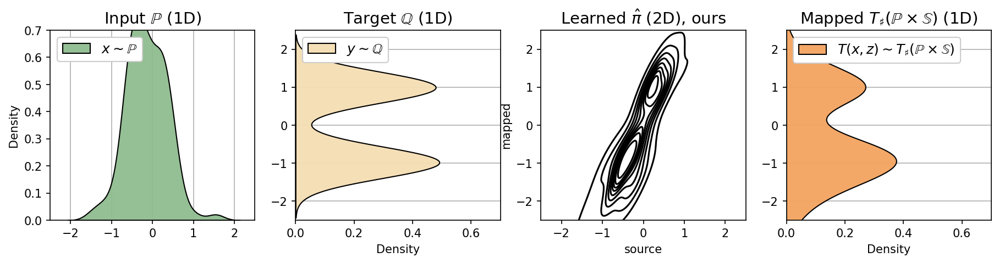

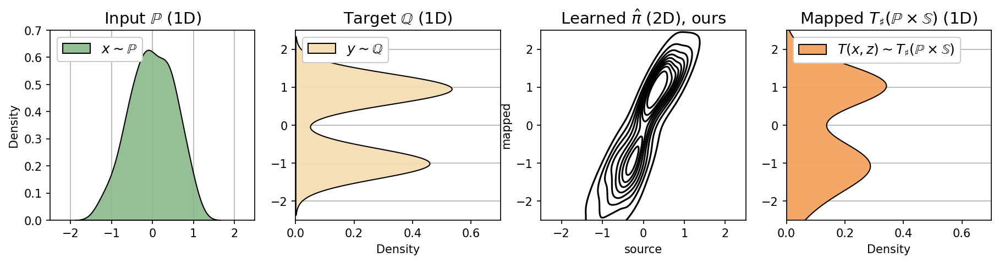

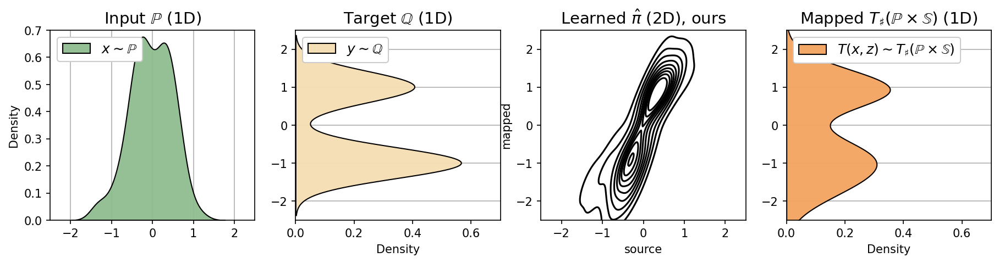

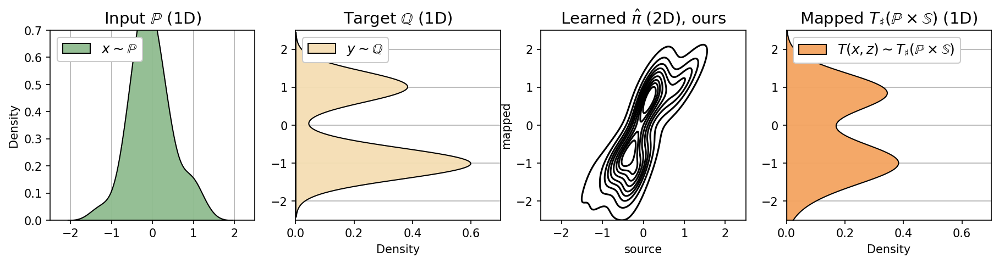

In [8]:
sm(sampler_source, sampler_target)

In [9]:
sm.sample(jnp.array([0]))

Array([[-1.1494025 ],
       [ 0.7902688 ],
       [-1.1621519 ],
       [ 1.1938322 ],
       [-0.07181486],
       [ 0.57017606],
       [ 0.2531821 ],
       [ 0.6977621 ],
       [ 0.5392336 ],
       [-0.35340488]], dtype=float32)

Variance p(Y|X=0.5) is 0.58


<Axes: ylabel='Density'>

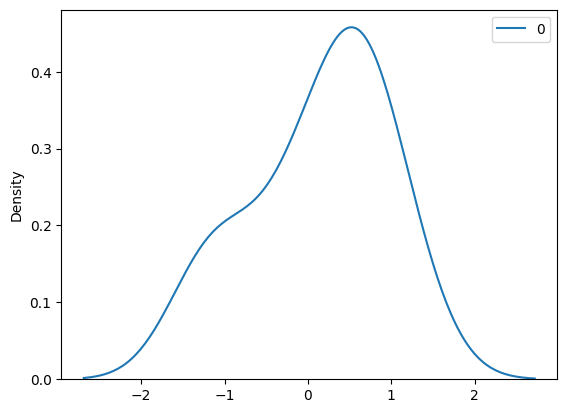

In [10]:
import seaborn as sns
sample_0 = sm.sample(jnp.array([0]))
print(f"Variance p(Y|X=0.5) is {jnp.var(sample_0):.2f}")
sns.kdeplot(sample_0)


Variance p(Y|X=0.5) is 0.05


<Axes: ylabel='Density'>

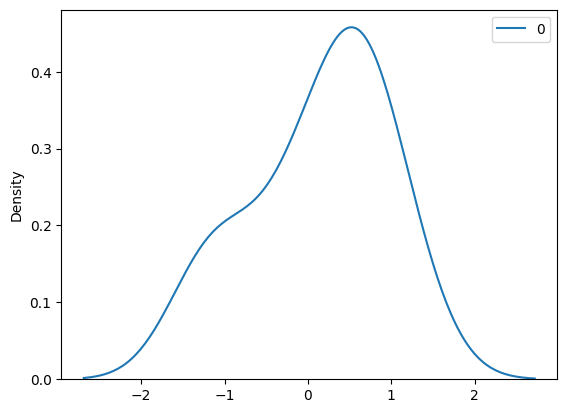

In [11]:
sample_05 = sm.sample(jnp.array([0.5]))
print(f"Variance p(Y|X=0.5) is {jnp.var(sample_05):.2f}")
sns.kdeplot(sample_0)

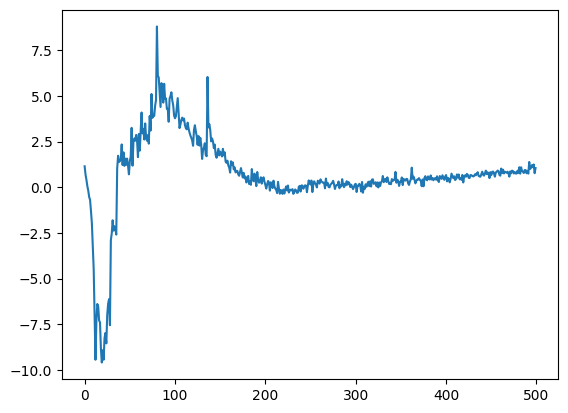

In [12]:
plt.plot(np.arange(len(sm.metrics["phi_obj"])), sm.metrics["phi_obj"])

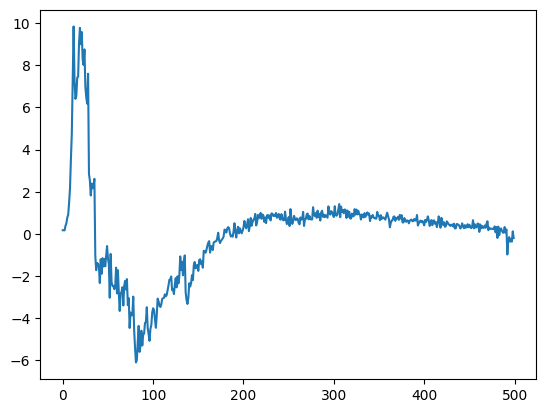

In [13]:
plt.plot(np.arange(len(sm.metrics["t_obj"])), sm.metrics["t_obj"])